Useful Notebook for Deformable DETR: https://github.com/NielsRogge/Transformers-Tutorials/blob/master/Deformable-DETR/Inference_with_Deformable_DETR_(CPU).ipynb

## Imports

In [3]:
import os
os.chdir('OW-DETR') # if we're not in the right directory

In [4]:
from models.backbone import build_backbone
from models.deformable_transformer import build_deforamble_transformer
from models.deformable_detr import build
from util.misc import NestedTensor

In [5]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
from PIL import Image
import requests
import numpy as np

from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

cuda


## Useful Functions

In [6]:
transform = T.Compose([
    T.Resize(800),  # Assuming 800 is the input size for the model
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Load and preprocess the image
def preprocess(image_path, device=device, transform=transform):
    image = Image.open(image_path)
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    return image_tensor, image

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32).to(device)
    return b

In [7]:
def detect(image_tensor, model, im_size):
    # Move the NestedTensor to the device
    image_tensor = image_tensor.to(device)

    with torch.no_grad():
        # Run the model
        outputs = model(image_tensor)

    # keep only predictions with 0.7+ confidence
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    # print(probas)
    keep = probas.max(-1).values > 0.3

    # Extract scores and bounding boxes
    scores = probas[keep].max(-1).values
    bboxes = outputs['pred_boxes'][0, keep]

    # Apply NMS
    keep_boxes = ops.nms(bboxes, scores, iou_threshold=0.8)  # Adjust the iou_threshold as necessary

    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im_size)
    return probas[keep], bboxes_scaled

In [8]:
# COCO classes
# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3, alpha=0.8))
        cl = p.argmax()
        # text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        # ax.text(xmin, ymin, bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

## Load OW-DETR

In [38]:
checkpoint = torch.load("../pretrained/checkpoint0044.pth", map_location=device)
print(checkpoint['args'])

Namespace(lr=0.0002, lr_backbone_names=['backbone.0'], lr_backbone=2e-05, lr_linear_proj_names=['reference_points', 'sampling_offsets'], lr_linear_proj_mult=0.1, batch_size=2, weight_decay=0.0001, epochs=45, lr_drop=40, lr_drop_epochs=None, clip_max_norm=0.1, sgd=False, with_box_refine=False, two_stage=False, frozen_weights=None, dilation=False, position_embedding='sine', position_embedding_scale=6.283185307179586, num_feature_levels=4, enc_layers=6, dec_layers=6, dim_feedforward=1024, hidden_dim=256, dropout=0.1, nheads=8, num_queries=100, dec_n_points=4, enc_n_points=4, masks=False, aux_loss=True, set_cost_class=2, set_cost_bbox=5, set_cost_giou=2, mask_loss_coef=1, dice_loss_coef=1, cls_loss_coef=2, bbox_loss_coef=5, giou_loss_coef=2, focal_alpha=0.25, coco_panoptic_path=None, remove_difficult=False, output_dir='exps/OWOD_t1_new_split', device='cuda', seed=42, resume='', start_epoch=0, eval=False, viz=False, eval_every=5, num_workers=2, cache_mode=False, PREV_INTRODUCED_CLS=0, CUR_I

In [39]:
model, criterion, postprocessors = build(checkpoint['args'])
model = model.to(device)

81
DINO resnet50


/mnt/c/Users/Sergiu/Desktop/AnomalyDetection/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/mnt/c/Users/Sergiu/Desktop/AnomalyDetection/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Invalid class rangw: [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]


In [40]:
print(checkpoint.keys())
msg = model.load_state_dict(checkpoint['model'], strict=False)
print(msg)

dict_keys(['model', 'optimizer', 'lr_scheduler', 'epoch', 'args'])
<All keys matched successfully>


## Run Example Object Detection Flow on single Image

In [63]:
image_tensor, image = preprocess("../assets/demo7.jpg")

# Creating a dummy mask (all ones)
# mask = torch.ones(image_tensor.size(0), image_tensor.size(2), image_tensor.size(3), dtype=torch.bool)
# nested_tensor = NestedTensor(image_tensor, mask).to(device)


In [64]:
# %%time
# outputs = model(image_tensor)

In [65]:
# outputs.keys()

In [66]:
# boxes, scores = outputs['pred_boxes'], outputs['pred_logits']
# print(boxes.shape, scores.shape)

In [67]:
# im = Image.open("../assets/demo5.jpg")

scores, boxes = detect(image_tensor, model, im_size=image.size)

tensor([[0.0037, 0.0060, 0.0031,  ..., 0.0040, 0.0085, 0.0043],
        [0.0077, 0.0156, 0.0134,  ..., 0.0113, 0.0151, 0.0033],
        [0.0063, 0.0052, 0.0211,  ..., 0.0068, 0.0077, 0.0077],
        ...,
        [0.0054, 0.0055, 0.0055,  ..., 0.0087, 0.0058, 0.0150],
        [0.0046, 0.0058, 0.0072,  ..., 0.0098, 0.0065, 0.0174],
        [0.0032, 0.0044, 0.0064,  ..., 0.0161, 0.0076, 0.0116]],
       device='cuda:0')


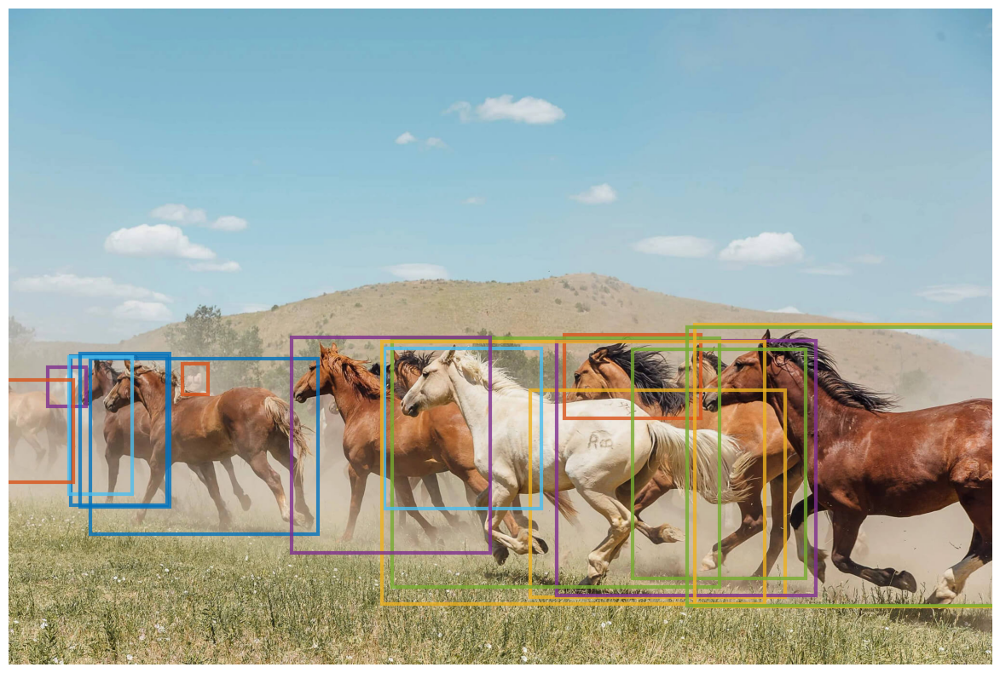

In [68]:
plot_results(image, scores, boxes)

## Run Object Detection on batch of images

In [41]:
import os
import glob

def list_image_files(directory, file_types=['*.jpg', '*.jpeg', '*.png']):
    files = []
    for file_type in file_types:
        files.extend(glob.glob(os.path.join(directory, file_type)))
    return files


In [42]:
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T
from util.misc import nested_tensor_from_tensor_list

class CustomDataset(Dataset):
    def __init__(self, directory, transform=None, file_types=['*.jpg', '*.jpeg', '*.png']):
        self.image_paths = list_image_files(directory, file_types)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

def custom_collate(batch):
    # Collate function modified to create NestedTensor required by Deformable DETR
    # Assuming that each item in batch is just an image tensor
    nested_tensor = nested_tensor_from_tensor_list(batch)
    return nested_tensor

In [17]:
transform = T.Compose([
    T.Resize((500, 500)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
assets_path = "../assets/"
dataset = CustomDataset(assets_path, transform=transform)
# When creating the DataLoader
data_loader = DataLoader(dataset, batch_size=8, shuffle=False, collate_fn=custom_collate)

In [18]:
import torchvision.ops as ops

def batch_detect(nested_tensor, model, device, iou_threshold=0.85, object_keep_probab=0.3):
    # Move the NestedTensor to the device
    nested_tensor = nested_tensor.to(device)

    with torch.no_grad():
        # Run the model
        outputs = model(nested_tensor)

    batch_detections = []

    # Extract tensor from NestedTensor
    tensor = nested_tensor.tensors
    for i in range(tensor.shape[0]):
        probas = outputs['pred_logits'][i].softmax(-1)[:, :-1]
        keep = probas.max(-1).values > object_keep_probab

        # Extract scores and bounding boxes
        scores = probas[keep].max(-1).values
        bboxes = outputs['pred_boxes'][i, keep]

        # Apply NMS
        keep_boxes = ops.nms(bboxes, scores, iou_threshold=iou_threshold)  # Adjust iou_threshold as needed

        # Rescale bounding boxes (assuming rescale_bboxes function handles this)
        bboxes_scaled = rescale_bboxes(bboxes[keep_boxes], nested_tensor.mask[i].shape[-2:])

        batch_detections.append((probas[keep][keep_boxes], bboxes_scaled))

    return batch_detections


In [81]:
%%time
for nested_tensor in data_loader:
    detections = batch_detect(nested_tensor, model, device)

CPU times: user 760 ms, sys: 3.29 ms, total: 763 ms
Wall time: 647 ms


In [19]:
## import matplotlib.pyplot as plt

def plot_batch_detections(images, detections_batch):
    """
    Plots the results for a batch of images and their detections.
    
    :param images: List of PIL images.
    :param detections_batch: List of detections for each image in the batch.
                             Each detection should be a tuple of (probabilities, boxes).
    """
    for img, detections in zip(images, detections_batch):
        prob, boxes = detections
        plot_results(img, prob, boxes)

# def plot_results(pil_img, prob, boxes, im_size=(500, 500)):
#     # Calculate scale factors for width and height
#     orig_width, orig_height = pil_img.size
#     scale_x = orig_width / im_size[0]
#     scale_y = orig_height / im_size[1]

#     plt.figure(figsize=(16,10))
#     plt.imshow(pil_img)
#     ax = plt.gca()

#     for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
#         # Scale box coordinates back to original image size
#         xmin, xmax = xmin * scale_x, xmax * scale_x
#         ymin, ymax = ymin * scale_y, ymax * scale_y

#         ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
#                                    fill=False, color=c, linewidth=3, alpha=0.8))
#         cl = p.argmax()
#         # Optionally, add text for each box
#         # text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
#         # ax.text(xmin, ymin, text, bbox=dict(facecolor='yellow', alpha=0.5))
#     plt.axis('off')
#     plt.show()



In [43]:
from PIL import Image
import os

def load_images_from_folder(folder):
    """
    Load all images in a folder into a list of PIL Image objects.

    :param folder: Path to the directory containing image files.
    :return: List of PIL Image objects.
    """
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        try:
            with Image.open(img_path) as img:
                images.append(img.copy())
        except IOError:
            # This will skip any files that aren't valid images
            print(f"Skipping file {filename}, unable to open or it's not an image file.")
    return images


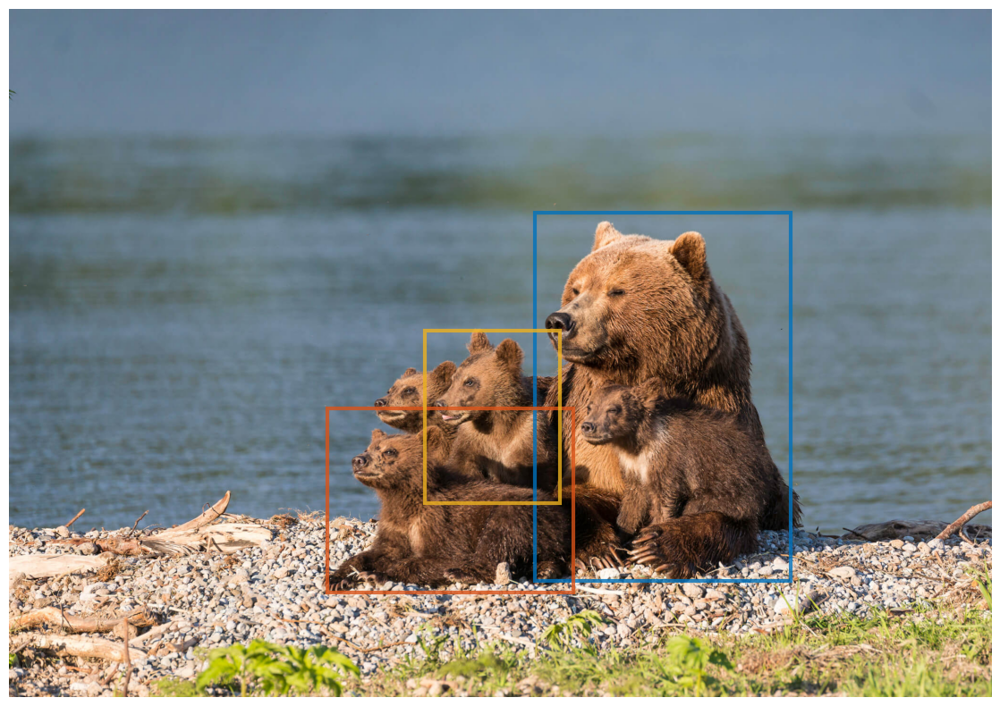

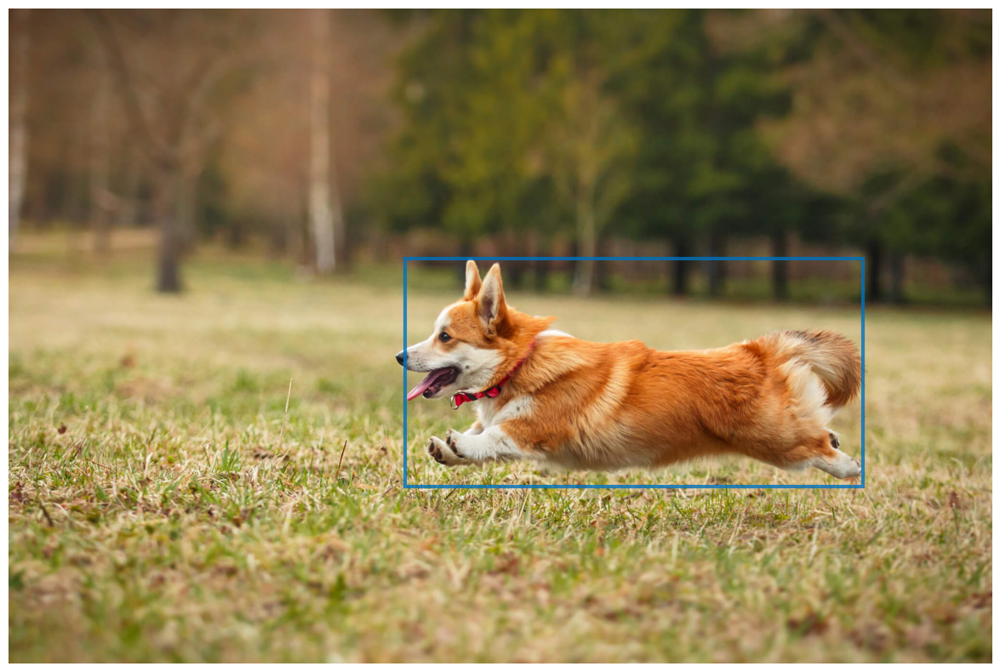

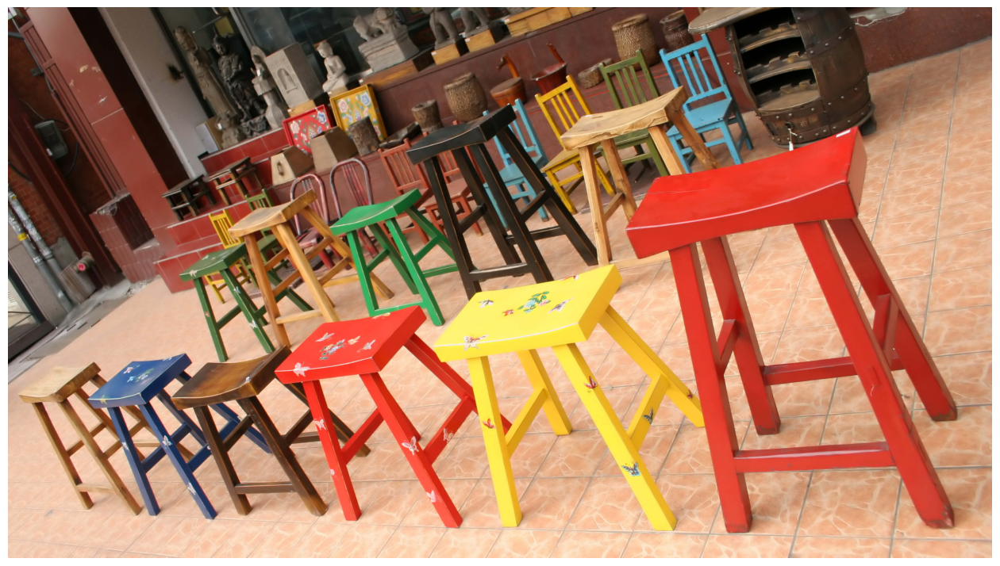

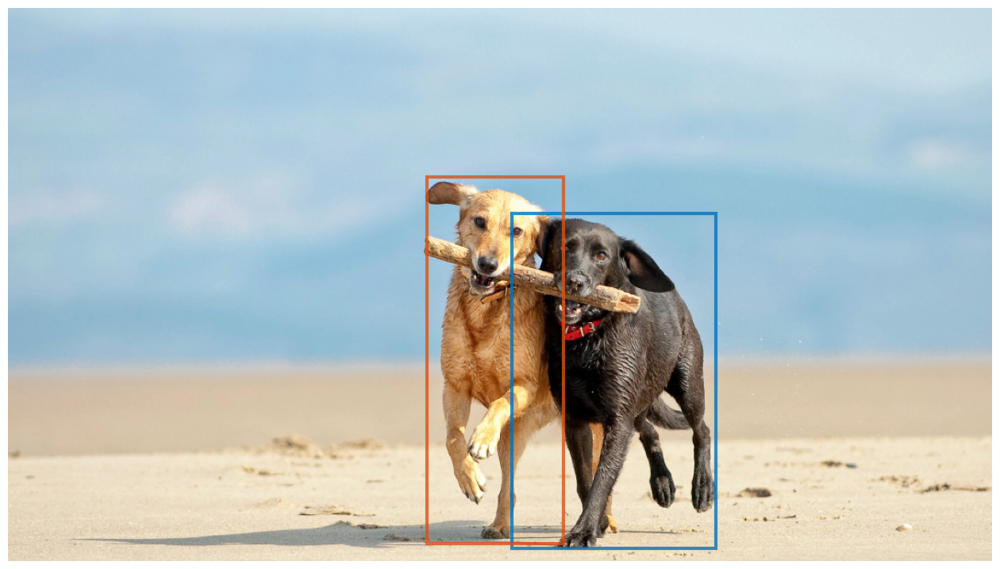

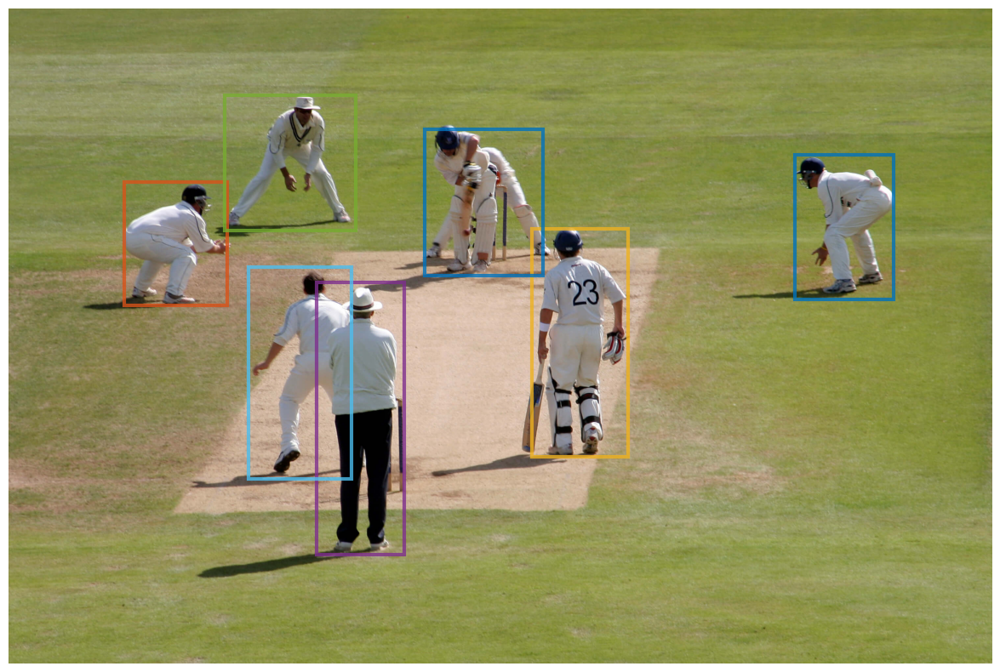

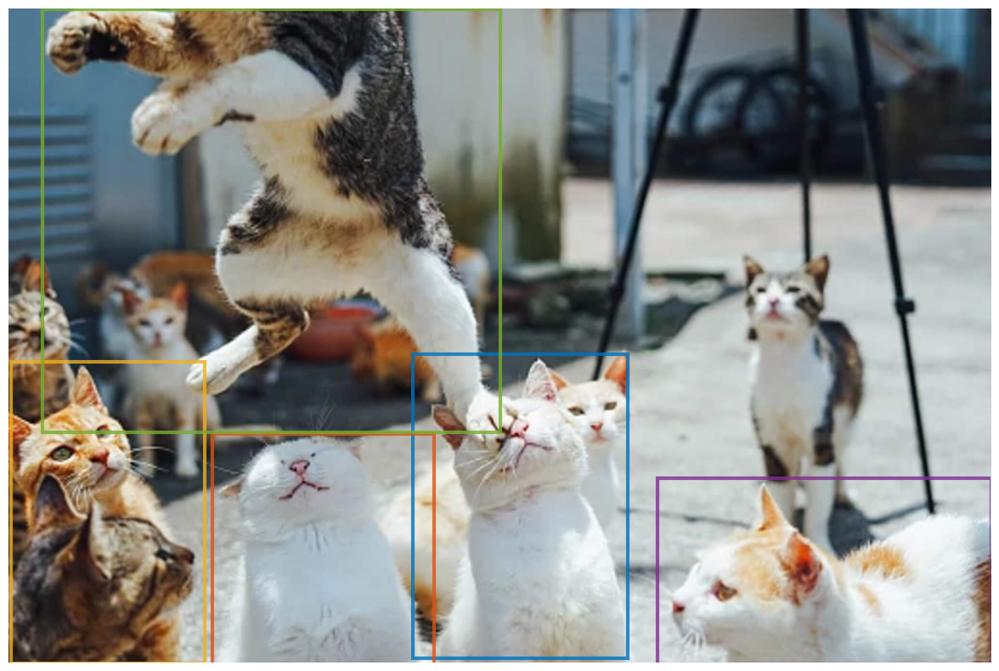

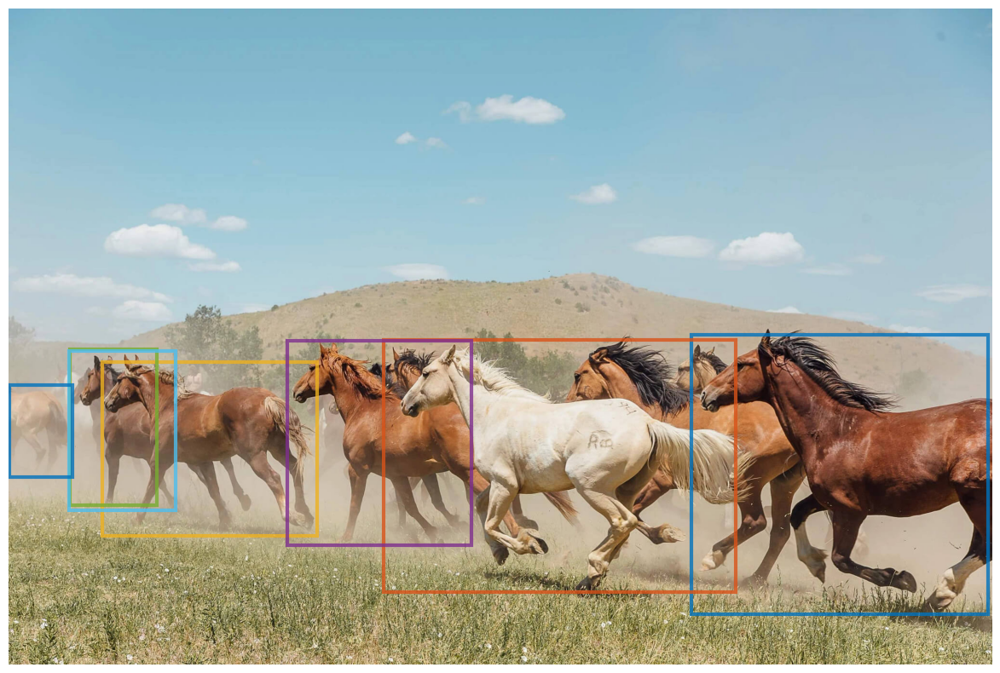

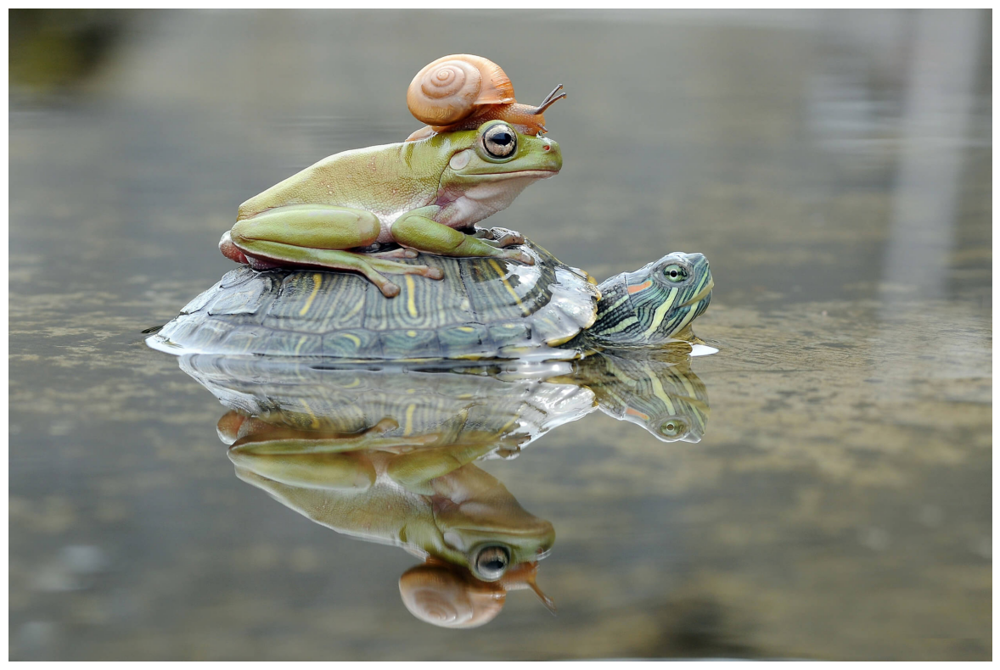

In [84]:
# Let's assume `detections` is the output from `batch_detect` function for a batch
# and `pil_images` is a list of PIL Image objects corresponding to that batch.
pil_images = load_images_from_folder(assets_path)
plot_batch_detections(pil_images, detections)

## Object Detection for CUHK Avenue

### File Display

In [44]:
train_dir = "../datasets/Avenue Dataset/train__/"
train_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16"]
train_video_paths = []
total_frames = 0
for dir in train_video_dirs:
    cur_dir = os.path.join(train_dir, dir)
    train_video_paths.append(cur_dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

../datasets/Avenue Dataset/train__/01 1364
../datasets/Avenue Dataset/train__/02 1511
../datasets/Avenue Dataset/train__/03 1487
../datasets/Avenue Dataset/train__/04 1511
../datasets/Avenue Dataset/train__/05 815
../datasets/Avenue Dataset/train__/06 1511
../datasets/Avenue Dataset/train__/07 1099
../datasets/Avenue Dataset/train__/08 1017
../datasets/Avenue Dataset/train__/09 1391
../datasets/Avenue Dataset/train__/10 1223
../datasets/Avenue Dataset/train__/11 781
../datasets/Avenue Dataset/train__/12 145
../datasets/Avenue Dataset/train__/13 366
../datasets/Avenue Dataset/train__/14 510
../datasets/Avenue Dataset/train__/15 353
../datasets/Avenue Dataset/train__/16 244
Total Frames: 15328


In [45]:
test_dir = "../datasets/Avenue Dataset/test__/"
test_video_dirs = ["01", "02", "03", "04", "05", "06", "07", "08", "09", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21"]
test_video_paths = []
total_frames = 0
for dir in test_video_dirs:
    cur_dir = os.path.join(test_dir, dir)
    test_video_paths.append(cur_dir)
    jpg_files = [f for f in os.listdir(cur_dir) if f.endswith('.jpg')]
    total_frames += len(jpg_files)
    print(cur_dir, len(jpg_files))
print(f"Total Frames: {total_frames}")

../datasets/Avenue Dataset/test__/01 1439
../datasets/Avenue Dataset/test__/02 1211
../datasets/Avenue Dataset/test__/03 923
../datasets/Avenue Dataset/test__/04 947
../datasets/Avenue Dataset/test__/05 1007
../datasets/Avenue Dataset/test__/06 1283
../datasets/Avenue Dataset/test__/07 605
../datasets/Avenue Dataset/test__/08 36
../datasets/Avenue Dataset/test__/09 1175
../datasets/Avenue Dataset/test__/10 841
../datasets/Avenue Dataset/test__/11 472
../datasets/Avenue Dataset/test__/12 1271
../datasets/Avenue Dataset/test__/13 549
../datasets/Avenue Dataset/test__/14 507
../datasets/Avenue Dataset/test__/15 1001
../datasets/Avenue Dataset/test__/16 740
../datasets/Avenue Dataset/test__/17 426
../datasets/Avenue Dataset/test__/18 294
../datasets/Avenue Dataset/test__/19 248
../datasets/Avenue Dataset/test__/20 273
../datasets/Avenue Dataset/test__/21 76
Total Frames: 15324


TODO: Flow

- Read the images from a folder
- Detect all objects
- Naming convention for saving image of detected object: {split}_{video_dir}_{frame}_{obj_number} (i.e. train_01_0894_02.jpg)
- This name will be used as a key for a `name2box` dict:
```
{
    'train':
    {
        "01" : ...
        "02" :
        {
            "0000" : [detections frame 0000],
            "0001" : [detections frame 0001]
        }
        ...
    }
    'test' :
            ...
}
```

In [46]:
preds_path = "../datasets/Avenue Dataset/predictions/"
train_preds_path = os.path.join(preds_path, "train/")
test_preds_path = os.path.join(preds_path, "test/")
print(train_preds_path, test_preds_path)

../datasets/Avenue Dataset/predictions/train/ ../datasets/Avenue Dataset/predictions/test/


In [47]:
print(test_video_paths[-1])
print(os.path.join(test_preds_path, test_video_dirs[-1]))

../datasets/Avenue Dataset/test__/21
../datasets/Avenue Dataset/predictions/test/21


In [48]:
objects_path = "../datasets/Avenue Dataset/objects/"
train_objects_path = os.path.join(objects_path, "train/")
test_objects_path = os.path.join(objects_path, "test/")
print(train_objects_path, test_objects_path)

../datasets/Avenue Dataset/objects/train/ ../datasets/Avenue Dataset/objects/test/


In [49]:
image_names = [img.split('/')[-1] for img in list_image_files(test_video_paths[-1])]
print(image_names)

['00.jpg', '01.jpg', '02.jpg', '03.jpg', '04.jpg', '05.jpg', '06.jpg', '07.jpg', '08.jpg', '09.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg', '21.jpg', '22.jpg', '23.jpg', '24.jpg', '25.jpg', '26.jpg', '27.jpg', '28.jpg', '29.jpg', '30.jpg', '31.jpg', '32.jpg', '33.jpg', '34.jpg', '35.jpg', '36.jpg', '37.jpg', '38.jpg', '39.jpg', '40.jpg', '41.jpg', '42.jpg', '43.jpg', '44.jpg', '45.jpg', '46.jpg', '47.jpg', '48.jpg', '49.jpg', '50.jpg', '51.jpg', '52.jpg', '53.jpg', '54.jpg', '55.jpg', '56.jpg', '57.jpg', '58.jpg', '59.jpg', '60.jpg', '61.jpg', '62.jpg', '63.jpg', '64.jpg', '65.jpg', '66.jpg', '67.jpg', '68.jpg', '69.jpg', '70.jpg', '71.jpg', '72.jpg', '73.jpg', '74.jpg', '75.jpg']


In [50]:
from PIL import ImageDraw, ImageFont
import matplotlib.pyplot as plt

def plot_results(pil_img, prob, boxes, im_size=(640, 360), display_img=True, save_path=None, crop_objects=False):
    orig_width, orig_height = pil_img.size
    scale_x = orig_width / im_size[0]
    scale_y = orig_height / im_size[1]

    # Create a copy of the image for cropping
    pil_img_copy = pil_img.copy()

    draw = ImageDraw.Draw(pil_img)
    font = ImageFont.load_default()  # Can be changed to another font

    cropped_images = []  # List to hold cropped objects

    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), COLORS * 100):
        xmin, xmax = xmin * scale_x, xmax * scale_x
        ymin, ymax = ymin * scale_y, ymax * scale_y

        color = tuple(int(255 * x) for x in c)
        draw.rectangle([xmin, ymin, xmax, ymax], outline=color, width=3)

        if crop_objects:
            # Cropping from the unaltered image copy
            cropped_obj = pil_img_copy.crop((xmin, ymin, xmax, ymax))
            cropped_images.append(cropped_obj)

        # Optionally add class text
        # cl = p.argmax()
        # text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        # draw.text((xmin, ymin), text, fill=color, font=font)

    if display_img:
        plt.figure(figsize=(16,10))
        plt.imshow(pil_img)
        plt.axis('off')
        plt.show()

    if save_path:
        pil_img.save(save_path)

    return pil_img, cropped_images


In [51]:
import os

def save_cropped_images(cropped_images, path, image_prefix=''):
    if not os.path.exists(path):
        os.makedirs(path)

    for i, image in enumerate(cropped_images):
        image_path = os.path.join(path, f"{image_prefix}_object_{i}.jpg")
        image.save(image_path)
        # print(f"Saved: {image_path}")

In [52]:
print(test_preds_path)

../datasets/Avenue Dataset/predictions/test/


### Train Images Object Detections

In [53]:
%%time
transform = T.Compose([
    T.Resize((640, 360)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
bbox_temp = {}

for i, video_path in enumerate(train_video_paths):
    print(video_path)
    image_names = [img.split('/')[-1] for img in list_image_files(train_video_paths[i])]

    for image_name in image_names:
        full_image_path = os.path.join(train_video_paths[i], image_name)
        
        image_tensor, image = preprocess(full_image_path, transform=transform)
        
        probab, boxes = detect(image_tensor, model, im_size=image.size)

        # TODO: Save this dict
        bbox_temp[image_name] = boxes
    
        image_prediction_path = os.path.join(train_preds_path, train_video_dirs[i], image_name)
        # print(image_prediction_path)
    
        # This function can now also create images with bounding boxes and the cropped objects and save them to a location
        _, cropped_objects = plot_results(image, probab, boxes, im_size=(640, 360), display_img=False, save_path=image_prediction_path, crop_objects=True)
    
        objects_prediction_path = os.path.join(train_objects_path, train_video_dirs[i])
        
        save_cropped_images(cropped_objects, objects_prediction_path, image_prefix=image_name.split('.')[0])

../datasets/Avenue Dataset/train__/01


/mnt/c/Users/Sergiu/Desktop/AnomalyDetection/venv/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


../datasets/Avenue Dataset/train__/02
../datasets/Avenue Dataset/train__/03
../datasets/Avenue Dataset/train__/04
../datasets/Avenue Dataset/train__/05
../datasets/Avenue Dataset/train__/06
../datasets/Avenue Dataset/train__/07
../datasets/Avenue Dataset/train__/08
../datasets/Avenue Dataset/train__/09
../datasets/Avenue Dataset/train__/10
../datasets/Avenue Dataset/train__/11
../datasets/Avenue Dataset/train__/12
../datasets/Avenue Dataset/train__/13
../datasets/Avenue Dataset/train__/14
../datasets/Avenue Dataset/train__/15
../datasets/Avenue Dataset/train__/16
CPU times: user 10min 59s, sys: 1min 5s, total: 12min 4s
Wall time: 10min 53s


### Test Images Object Detections

In [54]:
%%time
transform = T.Compose([
    T.Resize((640, 360)),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
bbox_temp = {}

for i, video_path in enumerate(test_video_paths):
    print(video_path)
    image_names = [img.split('/')[-1] for img in list_image_files(test_video_paths[i])]

    for image_name in image_names:
        full_image_path = os.path.join(test_video_paths[i], image_name)
        
        image_tensor, image = preprocess(full_image_path, transform=transform)
        
        probab, boxes = detect(image_tensor, model, im_size=image.size)

        # TODO: Save this dict
        bbox_temp[image_name] = boxes
    
        image_prediction_path = os.path.join(test_preds_path, test_video_dirs[i], image_name)
        # print(image_prediction_path)
    
        # This function can now also create images with bounding boxes and the cropped objects and save them to a location
        _, cropped_objects = plot_results(image, probab, boxes, im_size=(640, 360), display_img=False, save_path=image_prediction_path, crop_objects=True)
    
        objects_prediction_path = os.path.join(test_objects_path, test_video_dirs[i])
        
        save_cropped_images(cropped_objects, objects_prediction_path, image_prefix=image_name.split('.')[0])

    
    

../datasets/Avenue Dataset/test__/01
../datasets/Avenue Dataset/test__/02
../datasets/Avenue Dataset/test__/03
../datasets/Avenue Dataset/test__/04
../datasets/Avenue Dataset/test__/05
../datasets/Avenue Dataset/test__/06
../datasets/Avenue Dataset/test__/07
../datasets/Avenue Dataset/test__/08
../datasets/Avenue Dataset/test__/09
../datasets/Avenue Dataset/test__/10
../datasets/Avenue Dataset/test__/11
../datasets/Avenue Dataset/test__/12
../datasets/Avenue Dataset/test__/13
../datasets/Avenue Dataset/test__/14
../datasets/Avenue Dataset/test__/15
../datasets/Avenue Dataset/test__/16
../datasets/Avenue Dataset/test__/17
../datasets/Avenue Dataset/test__/18
../datasets/Avenue Dataset/test__/19
../datasets/Avenue Dataset/test__/20
../datasets/Avenue Dataset/test__/21
CPU times: user 10min 57s, sys: 1min 9s, total: 12min 6s
Wall time: 10min 37s


In [29]:
type(train_preds_path)

str

#### Delete all Train Predictions

In [32]:
import os
import glob

for train_video_dir in train_video_dirs:
    full_prediction_dir_path = os.path.join(train_preds_path, train_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


../datasets/Avenue Dataset/predictions/train/01
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0000.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0001.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0002.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0003.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0004.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0005.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0006.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0007.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0008.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0009.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0010.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0011.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0012.jpg
Deleted: ../datasets/Avenue Dataset/predictions/train/01/0013.jpg
Deleted: ../datasets/Avenue 

#### Delete all Train objects

In [33]:
import os
import glob

for train_video_dir in train_video_dirs:
    full_prediction_dir_path = os.path.join(train_objects_path, train_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


../datasets/Avenue Dataset/objects/train/01
../datasets/Avenue Dataset/objects/train/02
../datasets/Avenue Dataset/objects/train/03
../datasets/Avenue Dataset/objects/train/04
../datasets/Avenue Dataset/objects/train/05
../datasets/Avenue Dataset/objects/train/06
../datasets/Avenue Dataset/objects/train/07
../datasets/Avenue Dataset/objects/train/08
../datasets/Avenue Dataset/objects/train/09
../datasets/Avenue Dataset/objects/train/10
../datasets/Avenue Dataset/objects/train/11
../datasets/Avenue Dataset/objects/train/12
../datasets/Avenue Dataset/objects/train/13
../datasets/Avenue Dataset/objects/train/14
../datasets/Avenue Dataset/objects/train/15
../datasets/Avenue Dataset/objects/train/16


#### Delete all Test Predictions

In [36]:
import os
import glob

for test_video_dir in test_video_dirs:
    full_prediction_dir_path = os.path.join(test_preds_path, test_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


../datasets/Avenue Dataset/predictions/test/01
../datasets/Avenue Dataset/predictions/test/02
../datasets/Avenue Dataset/predictions/test/03
../datasets/Avenue Dataset/predictions/test/04
../datasets/Avenue Dataset/predictions/test/05
../datasets/Avenue Dataset/predictions/test/06
../datasets/Avenue Dataset/predictions/test/07
../datasets/Avenue Dataset/predictions/test/08
../datasets/Avenue Dataset/predictions/test/09
../datasets/Avenue Dataset/predictions/test/10
../datasets/Avenue Dataset/predictions/test/11
../datasets/Avenue Dataset/predictions/test/12
../datasets/Avenue Dataset/predictions/test/13
../datasets/Avenue Dataset/predictions/test/14
../datasets/Avenue Dataset/predictions/test/15
../datasets/Avenue Dataset/predictions/test/16
../datasets/Avenue Dataset/predictions/test/17
../datasets/Avenue Dataset/predictions/test/18
../datasets/Avenue Dataset/predictions/test/19
../datasets/Avenue Dataset/predictions/test/20
../datasets/Avenue Dataset/predictions/test/21


#### Delete all Test Objects

In [37]:
import os
import glob

for test_video_dir in test_video_dirs:
    full_prediction_dir_path = os.path.join(test_objects_path, test_video_dir)
    print(full_prediction_dir_path)

    # Get a list of all image files in the directory
    image_files = glob.glob(os.path.join(full_prediction_dir_path, "*.jpg"))  # Update the extension if needed
    image_files.extend(glob.glob(os.path.join(full_prediction_dir_path, "*.png")))  # Add other image formats if necessary

    # Loop through the files and delete each one
    for file_path in image_files:
        try:
            os.remove(file_path)
            # print(f"Deleted: {file_path}")
        except OSError as e:
            print(f"Error: {file_path} : {e.strerror}")


../datasets/Avenue Dataset/objects/test/01
../datasets/Avenue Dataset/objects/test/02
../datasets/Avenue Dataset/objects/test/03
../datasets/Avenue Dataset/objects/test/04
../datasets/Avenue Dataset/objects/test/05
../datasets/Avenue Dataset/objects/test/06
../datasets/Avenue Dataset/objects/test/07
../datasets/Avenue Dataset/objects/test/08
../datasets/Avenue Dataset/objects/test/09
../datasets/Avenue Dataset/objects/test/10
../datasets/Avenue Dataset/objects/test/11
../datasets/Avenue Dataset/objects/test/12
../datasets/Avenue Dataset/objects/test/13
../datasets/Avenue Dataset/objects/test/14
../datasets/Avenue Dataset/objects/test/15
../datasets/Avenue Dataset/objects/test/16
../datasets/Avenue Dataset/objects/test/17
../datasets/Avenue Dataset/objects/test/18
../datasets/Avenue Dataset/objects/test/19
../datasets/Avenue Dataset/objects/test/20
../datasets/Avenue Dataset/objects/test/21
